# INF2008 Group P5-1 
# Singapore HDB Resale Price Prediction

# 1. Problem Statement

HDB flats are often labelled as the government's first gift to Singaporeans, leading majority of the population living in them. While many Singaporeans acquire their homes through the Build-to-Order (BTO) scheme, a considerable number of people choose to purchase flats on the resale market due to various reasons.

Throughout the years, it has become a known fact that purchasing a home is often the largest financial decision most people will make, it is essential to ensure that the price paid reflects the property's true value. Overpaying for a flat could lead to significant financial setbacks, sometimes amounting to tens or even hundreds of thousands of dollars.

Determining the right price for a HDB resale flat is complicated, as there are many factors that influence housing prices, giving buyers a hard time in determining the best home for their future. This project aims to tackle the challenge of accurately estimating resale values.

Key Question:
**<center>How can we effectively forecast the resale price of an HDB flat using relevant data?</center>**

This initiative seeks to empower buyers by providing clarity on the factors that drive resale prices, helping them make sound financial decisions when selecting resale flats. To achieve this, a linear regression model will be utilized, with resale price as the outcome variable and key housing-related factors as predictors.

Model performance will be evaluated using the Root Mean Square Error (RMSE), where a smaller RMSE reflects better predictive accuracy.

The project’s primary beneficiaries are home buyers seeking guidance on fair pricing. Additionally, housing agents, who play a critical role in advising buyers, will also find the insights valuable.

# 2. Data Collection

### 2.1 Data Import

Let us start off by importing the combined dataset.

In [45]:
%pip install pandas matplotlib numpy plotly nbformat 

Note: you may need to restart the kernel to use updated packages.


In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [47]:
# Importing data.
df = pd.read_csv('../dataset/combined_data.csv')

In [48]:
print(df.shape)
df.head(10)

(235565, 11)


,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
0,2015-01,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,07 TO 09,60.0,Improved,1986,70,255000.0
1,2015-01,ANG MO KIO,3 ROOM,541,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1981,65,275000.0
2,2015-01,ANG MO KIO,3 ROOM,163,ANG MO KIO AVE 4,01 TO 03,69.0,New Generation,1980,64,285000.0
3,2015-01,ANG MO KIO,3 ROOM,446,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1979,63,290000.0
4,2015-01,ANG MO KIO,3 ROOM,557,ANG MO KIO AVE 10,07 TO 09,68.0,New Generation,1980,64,290000.0
5,2015-01,ANG MO KIO,3 ROOM,603,ANG MO KIO AVE 5,07 TO 09,67.0,New Generation,1980,64,290000.0
6,2015-01,ANG MO KIO,3 ROOM,709,ANG MO KIO AVE 8,01 TO 03,68.0,New Generation,1980,64,290000.0
7,2015-01,ANG MO KIO,3 ROOM,333,ANG MO KIO AVE 1,01 TO 03,68.0,New Generation,1981,65,293000.0
8,2015-01,ANG MO KIO,3 ROOM,109,ANG MO KIO AVE 4,01 TO 03,67.0,New Generation,1978,62,300000.0
9,2015-01,ANG MO KIO,3 ROOM,564,ANG MO KIO AVE 3,13 TO 15,68.0,New Generation,1985,69,307500.0


As shown above, we have a total of up to 235,565 datasets with 11 columns, now we will walk through the data cleaning process.

# 3 Data Preprocessing 

### 3.1 Handling Duplicate Values

In [ ]:
df.duplicated().sum()
df[df.duplicated()]

np.int64(0)

As reflected, we have identified 321 rows x 11 columns of duplicated data, now let us drop the duplicated data.

In [41]:
df = df.drop_duplicates()

# Looking for columns with null values
df.isnull().sum()

month                  0
town                   0
flat_type              0
block                  0
street_name            0
storey_range           0
floor_area_sqm         0
flat_model             0
lease_commence_date    0
remaining_lease        0
resale_price           0
dtype: int64

As shown above, we have detected no null values within the dataset.

### 3.2 Transforming remaining_lease

Due to the combination of datasets, we have identified that the remaining_lease columns are not consistent in terms of the units defined. Therefore, we decided to normalise them in years format.

In [14]:
# Calculate remaining lease using lease commence date
current_year = 2025  # Replace with the relevant current year
df['remaining_lease'] = 99 - (current_year - df['lease_commence_date'])

# Ensure no negative values (clip to 0 for expired leases)
df['remaining_lease'] = df['remaining_lease'].clip(lower=0)


In [15]:
df.tail(10) #The last 10 rows

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
235555,2025-01,YISHUN,5 ROOM,238,YISHUN RING RD,01 TO 03,127.0,Improved,1985,59,650000.0
235556,2025-01,YISHUN,5 ROOM,109,YISHUN RING RD,07 TO 09,121.0,Improved,1982,56,695000.0
235557,2025-01,YISHUN,5 ROOM,297,YISHUN ST 20,01 TO 03,111.0,Improved,2000,74,608000.0
235558,2025-01,YISHUN,5 ROOM,265,YISHUN ST 22,01 TO 03,122.0,Improved,1986,60,625000.0
235559,2025-01,YISHUN,5 ROOM,511B,YISHUN ST 51,10 TO 12,113.0,Improved,2017,91,730000.0
235560,2025-01,YISHUN,5 ROOM,502B,YISHUN ST 51,07 TO 09,112.0,Improved,2018,92,776000.0
235561,2025-01,YISHUN,5 ROOM,871,YISHUN ST 81,07 TO 09,122.0,Improved,1988,62,738000.0
235562,2025-01,YISHUN,5 ROOM,851,YISHUN ST 81,10 TO 12,127.0,Improved,1988,62,740000.0
235563,2025-01,YISHUN,EXECUTIVE,352,YISHUN RING RD,04 TO 06,146.0,Maisonette,1988,62,1008000.0
235564,2025-01,YISHUN,EXECUTIVE,614,YISHUN ST 61,04 TO 06,146.0,Maisonette,1987,61,800000.0


Using this example, this is to illustrate the changes made for remaining_lease on the second half of the dataset from years and months into years only.

### 3.3 Handling Data Types

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 235244 entries, 0 to 235564
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                235244 non-null  object 
 1   town                 235244 non-null  object 
 2   flat_type            235244 non-null  object 
 3   block                235244 non-null  object 
 4   street_name          235244 non-null  object 
 5   storey_range         235244 non-null  object 
 6   floor_area_sqm       235244 non-null  float64
 7   flat_model           235244 non-null  object 
 8   lease_commence_date  235244 non-null  int64  
 9   remaining_lease      235244 non-null  int64  
 10  resale_price         235244 non-null  float64
dtypes: float64(2), int64(2), object(7)
memory usage: 21.5+ MB


### 3.4 Transforming storey_range



As storey_range are values that are categorical e.g. 4 TO 6, we need to transform them to a median value such that it allows us to have more accurate insights when identifying trends or relationships as the different storey levels affects HDB prices. By transforming them to numerical data allows us to have an easier time when creating our models.

In [49]:
# Transform storey_range values to median values

def convert_to_median(row):
	storey_range = row["storey_range"].split(" TO ")
	median = (int(storey_range[0]) + int(storey_range[1])) / 2
	return median

df["median_storey"] = df.apply(convert_to_median, axis=1)
df = df.drop(columns=['storey_range'])

In [50]:
df.tail()

,month,town,flat_type,block,street_name,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,median_storey
235560,2025-01,YISHUN,5 ROOM,502B,YISHUN ST 51,112.0,Improved,2018,92 years 01 month,776000.0,8.0
235561,2025-01,YISHUN,5 ROOM,871,YISHUN ST 81,122.0,Improved,1988,62 years 04 months,738000.0,8.0
235562,2025-01,YISHUN,5 ROOM,851,YISHUN ST 81,127.0,Improved,1988,62 years 04 months,740000.0,11.0
235563,2025-01,YISHUN,EXECUTIVE,352,YISHUN RING RD,146.0,Maisonette,1988,62 years 07 months,1008000.0,5.0
235564,2025-01,YISHUN,EXECUTIVE,614,YISHUN ST 61,146.0,Maisonette,1987,61 years 05 months,800000.0,5.0


### 3.5 Transforming flat_type and flat_model

Since flat_type and flat_model are ordinal data as they have an ordinal relationship, we will assign a unique integer to each category such that they still have their fixed ranking.

# 4 Data Analysis

### 4.1 Distribution of Dependent Variables

In [18]:
df['resale_price'].describe()

count    2.352440e+05
mean     4.977054e+05
std      1.741972e+05
min      1.400000e+05
25%      3.700000e+05
50%      4.638880e+05
75%      5.950000e+05
max      1.600000e+06
Name: resale_price, dtype: float64

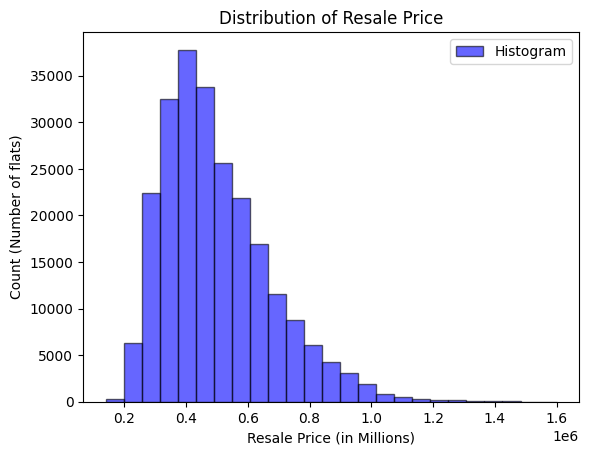

In [19]:

# Create histogram
data = df['resale_price']
plt.hist(data, bins=25, alpha=0.6, color='b', edgecolor='black', label='Histogram')

# Add titles and labels
plt.title('Distribution of Resale Price')
plt.xlabel('Resale Price (in Millions)')
plt.ylabel('Count (Number of flats)')

# Add legend
plt.legend()

# Show plot
plt.show()

Interpretation: The resale price distribution is slightly left-skewed, with the majority of flats priced in the lower range. However, the tail extends toward higher prices, indicating the presence of some higher-value properties, which aligns with the trends observed in the summary statistics.

Let us get a better understanding of our resale price by breaking it across features.

C:\Users\Leon\AppData\Local\Temp\ipykernel_548\4212493500.py:10: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


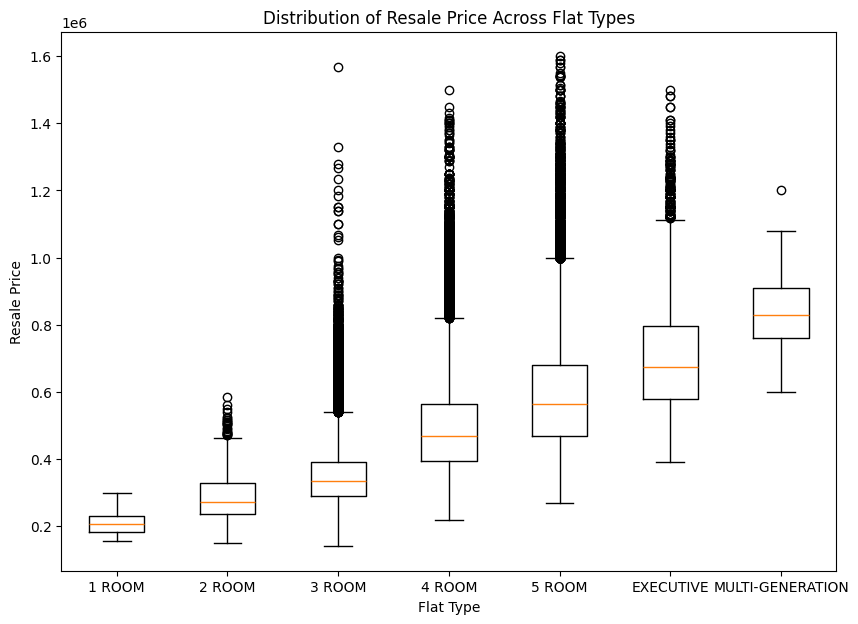

In [20]:
# Define flat type order
flat_type_order = ['1 ROOM', '2 ROOM', '3 ROOM', '4 ROOM', '5 ROOM', 'EXECUTIVE', 'MULTI-GENERATION']

# Reorder the data to follow the specified flat type order
df['flat_type'] = pd.Categorical(df['flat_type'], categories=flat_type_order, ordered=True)
df = df.sort_values('flat_type')

# Create the boxplot
plt.figure(figsize=(10, 7))
plt.boxplot(
    [df.loc[df['flat_type'] == flat_type, 'resale_price'] for flat_type in flat_type_order],
    labels=flat_type_order
)

# Add title and labels
plt.title('Distribution of Resale Price Across Flat Types')
plt.xlabel('Flat Type')
plt.ylabel('Resale Price')

# Show the plot
plt.show()

Larger flat types generally have higher resale prices, with 1 ROOM and 2 ROOM flats being the cheapest and EXECUTIVE and MULTI-GENERATION flats being the most expensive. Smaller flats have more consistent prices, while larger ones show more variation and include higher-priced outliers. Some 5 ROOM and EXECUTIVE flats are priced over $1.5 million, likely due to premium locations or features.

C:\Users\Leon\AppData\Local\Temp\ipykernel_548\3469271478.py:12: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, vert=False, labels=towns)


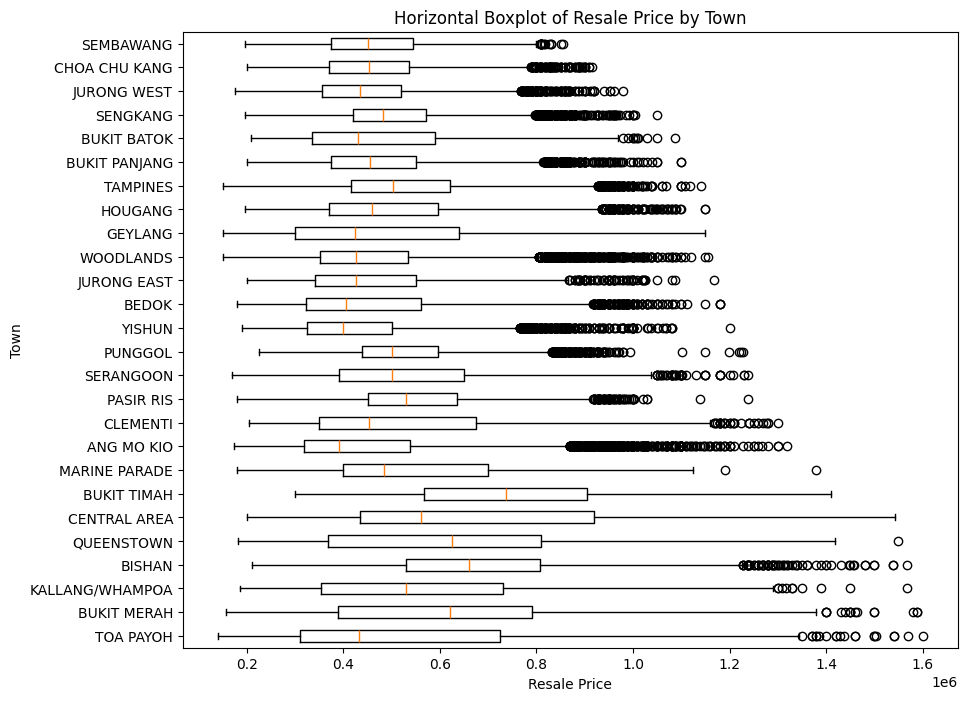

In [21]:
# Sort the DataFrame by resale_price
sorted_df = df.sort_values(by='resale_price', ascending=False)

# Get unique towns
towns = sorted_df['town'].unique()

# Prepare data for the boxplot
data = [sorted_df.loc[sorted_df['town'] == town, 'resale_price'] for town in towns]

# Create the horizontal boxplot
plt.figure(figsize=(10, 8))
plt.boxplot(data, vert=False, labels=towns)

# Add labels and title
plt.xlabel('Resale Price')  # Set the x-axis label
plt.ylabel('Town')  # Set the y-axis label
plt.title('Horizontal Boxplot of Resale Price by Town')  # Set the title

# Show the plot
plt.show()

Interpretation: Resale prices vary a lot depending on the location and nearby facilities. Central towns like Bukit Timah, Queenstown, and Central Area are more expensive because they’re closer to the city, well-connected, and have more amenities. Suburban towns like Sembawang and Choa Chu Kang are cheaper since they’re farther from the city and less developed. Prices can also go up in towns near MRT stations, good schools, or malls. The high-priced outliers in some towns might be due to unique features or very desirable locations.

## 4.2 Scatterplots of Strongest Independent Varables against Dependent Variables

### 4.2.1 Relationship between Floor Area and Resale Price

In [22]:
import plotly.express as px
import nbformat


scatterplt = px.scatter(
    df,
    x='floor_area_sqm',
    y='resale_price',
    color='flat_type',  # Optional: Add this for color differentiation
    title='Relationship Between Floor Area and Resale Price',
    width=900,
    height=800
)

scatterplt.show()



Interpretation: The scatterplot reveals a clear positive relationship between floor area and resale price, indicating that larger flats tend to have higher resale prices. Smaller flats, such as 1 ROOM and 2 ROOM, are concentrated in the lower left of the plot, with smaller floor areas and lower resale prices. In contrast, larger flats like EXECUTIVE and MULTI-GENERATION are positioned in the upper right, reflecting their bigger floor areas and significantly higher prices. Each flat type forms distinct clusters, suggesting that floor area strongly correlates with both the flat type and its price. However, there are some outliers, where certain flats have much higher prices than expected for their size, likely due to other factors such as location, condition, or special features. Overall, the plot highlights that while larger floor areas generally lead to higher prices, other variables also play a role in determining resale value.

### 4.2.2 Relationship between Lease Commence Date and Resale Price

In [23]:
# Group by 'lease_commence_date' and calculate the average resale price
avg_price_by_lease = df.groupby('lease_commence_date')['resale_price'].mean().reset_index()

# Create the line plot
fig = px.line(
    avg_price_by_lease,
    x='lease_commence_date',
    y='resale_price',
    title='Average Resale Price by Lease Commencement Year',
    labels={
        'lease_commence_date': 'Lease Commencement Year',
        'resale_price': 'Average Resale Price'
    },
    width=900,
    height=600,
    markers=True  # Add markers to the line
)

# Customize layout
fig.update_layout(
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    xaxis_tickangle=45,  # Rotate x-axis labels if needed
    template='plotly_white',  # Use a clean background
)

# Show the plot
fig.show()

Interpretation: Flats with newer leases (1990s to 2010s) generally have higher resale prices because they’re in better condition and come with modern features. Older flats (before the 1990s) are usually cheaper because they have shorter leases left, making them less attractive to buyers. However, flats in prime locations or near amenities like MRT stations, schools, or malls can still be expensive, even if they’re older. Prices also change based on market demand and trends.

### 4.2.3 Relationship between Remaining Lease and Resale Price

In [24]:
# Create the scatter plot
fig = px.scatter(
    df,
    x='remaining_lease',
    y='resale_price',
    title='Resale Price vs. Remaining Lease',
    labels={'remaining_lease': 'Remaining Lease (Years)', 'resale_price': 'Resale Price'},
    width=900,
    height=600,
    opacity=0.6  # Make points slightly transparent
)

# Show the plot
fig.show()

Interpreation: Flats with longer remaining leases, especially those with over 80 years left, tend to have higher resale prices because they are more desirable and easier to finance. Flats with shorter remaining leases, particularly below 50 years, are generally cheaper since they are less attractive to buyers and have loan restrictions. However, some flats with short leases still sell at high prices, likely due to their prime location or proximity to key amenities like MRT stations or malls.

# 5 Predictive Modelling

So our objective here is to build a machine learning model to predict resale prices based on features like location, flat type, remaining lease, and size.

We will use a smaller sample dataset from the combined dataset for faster and more optimized predicting

Firstly, let us install the necessary files

In [33]:
%pip install scikit-learn

   ---------------------------------------- 0.0/11.1 MB ? eta -:--:--
   -- ------------------------------------- 0.8/11.1 MB 4.8 MB/s eta 0:00:03
   ---- ----------------------------------- 1.3/11.1 MB 3.3 MB/s eta 0:00:03
   ------ --------------------------------- 1.8/11.1 MB 3.3 MB/s eta 0:00:03
   -------- ------------------------------- 2.4/11.1 MB 2.9 MB/s eta 0:00:03
   ---------- ----------------------------- 2.9/11.1 MB 2.8 MB/s eta 0:00:03
   ----------- ---------------------------- 3.1/11.1 MB 2.8 MB/s eta 0:00:03
   ------------- -------------------------- 3.7/11.1 MB 2.6 MB/s eta 0:00:03
   ---------------- ----------------------- 4.5/11.1 MB 2.7 MB/s eta 0:00:03
   ------------------ --------------------- 5.2/11.1 MB 2.9 MB/s eta 0:00:03
   -------------------- ------------------- 5.8/11.1 MB 2.9 MB/s eta 0:00:02
   ------------------------ --------------- 6.8/11.1 MB 3.0 MB/s eta 0:00:02
   --------------------------- ------------ 7.6/11.1 MB 3.1 MB/s eta 0:00:02
   ---

Steps:
1. Prepare the dataset by encoding categorical variables and normalizing numerical features.
2. Train models such as linear regression, decision trees, or random forests.
3. Evaluate performance using metrics like R² and RMSE.

C:\Users\Leon\AppData\Local\Temp\ipykernel_548\3103210991.py:20: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[3 4 3 ... 3 4 3]' has dtype incompatible with category, please explicitly cast to a compatible dtype first.



R² Score: 0.73
RMSE: 89658.94


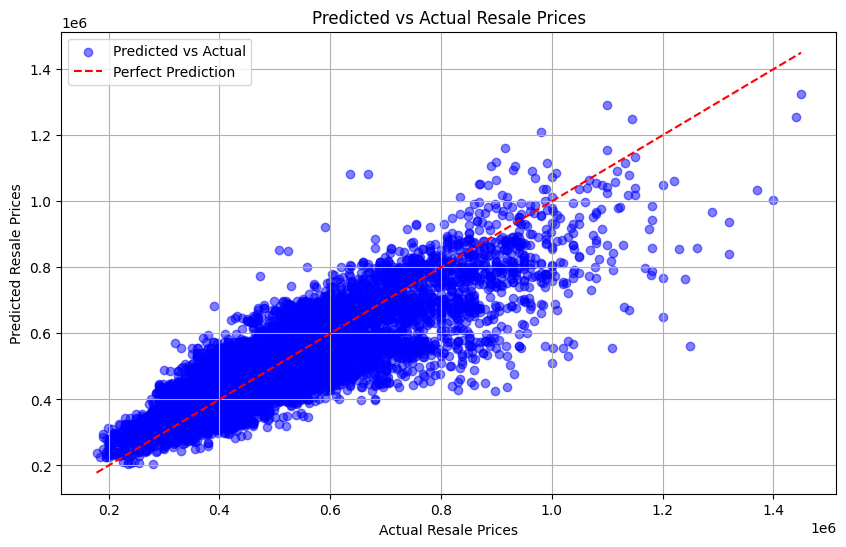

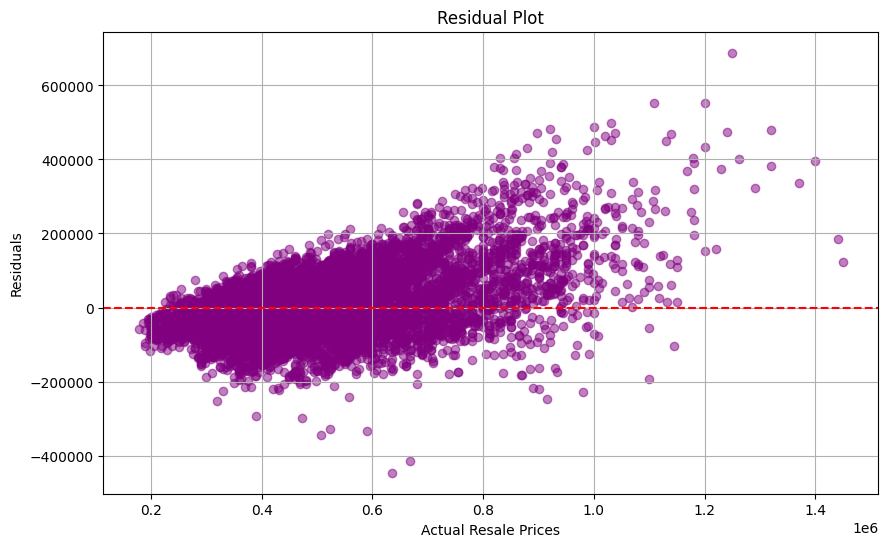

In [40]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Sample dataset since our combined is too large, will make the running v slow
df_sampled = df.sample(n=50000, random_state=42)

# step 1: Select relevant features and target
features = df_sampled[['town', 'flat_type', 'floor_area_sqm', 'remaining_lease', 'storey_range']].copy()
target = df_sampled['resale_price']

# step 2: Encode categorical variables with LabelEncoder, use .loc if not error will come out
label_encoders = {}
for col in ['town', 'flat_type', 'storey_range']:
    le = LabelEncoder()
    features.loc[:, col] = le.fit_transform(features[col])
    label_encoders[col] = le

# Step 3: split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Step 4: train a Random Forest Regressor model, can explore other model or improve this model
model = RandomForestRegressor(n_estimators=50, max_depth=10, n_jobs=-1, random_state=42)
model.fit(X_train, y_train)

# Step 5: Make predictions
y_pred = model.predict(X_test)

# Step 6: Evaluate the model
r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# Display evaluation metrics
print(f"R² Score: {r2:.2f}")
print(f"RMSE: {rmse:.2f}")

# Plot 1: Actual vs Predicted Resale Prices
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5, label="Predicted vs Actual", color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

# Plot 2: Residual Plot
residuals = y_test - y_pred

plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()


Now that we have our R² Score and RMSE, we will now interpret the results.

R² Score Range:
1.0: Perfect fit (model explains all the variance).
0.0: Model explains no variance.
Negative: Model performs worse than a horizontal line (mean prediction).

Our R² score: 0.73

This suggests that 73% of the variance in resale prices is explained by the model. While this is decent, there is room for improvement.

Our RMSE Score: 89658.94

This means the model's predictions are, on average, off by approximately SGD 89,658, not very good.

Evaluate Model Suitability
Is an R² of 0.73 acceptable for our use case?
For deployment (e.g., resale price prediction tools), aim for higher accuracy.
Compare RMSE to the range of resale prices.
If typical resale prices range between SGD 300,000 and SGD 800,000, an error of ~SGD 90,000 might be tolerable but could still impact user trust in predictions.
Therefore, we must refine the model.